# Большое практическое задание 2
# Классификация заемщиков линейными моделями

## курс "Машинное обучение 1", программа AIMasters, 2022

## Студент: Зеленин Герман Евгеньевич

## Формулировка задания
Данное задание направлено на ознакомление с линейными моделями и градиентными методами обучения. В
задании необходимо: <br>
1. Написать на языке Python собственную реализацию линейного классификатора с произвольной функцией потерь и реализацию функции и градиента функции потерь для логистической регрессии. Реализации можно частично проверить через юнит-тесты и с помощью системы ejudge в соответствующем соревновании. <br><br> **Внимание.** Прохождение всех тестов в соревновании не гарантирует правильность решения. 


2. Вывести все необходимые формулы, привести выкладки в отчёте. 


3. Провести описанные ниже эксперименты с модельными данными и приложенным датасетом в данном ноутбуке. Подготовить отчёт о проделанной работе. Удалите черновые выводы, оставьте только тот код, который является ответом к пунктам задания. Сохраните ноутбук в форматах .ipynb и .html одновременно. <br><br> **Замечание.** Чтобы экспорировать jupyter notebook в .html нужно выбрать: `File -> Download as -> HTML (.html)`. Для экспорта notebook в .html в Google Colab, воспользуйтесь [следующим кодом](https://gist.github.com/vbugaevskii/b9c6181f2ad83e11f5b9c92d315cb2de). Большая просьба: подписывайте свой отчет (в названии файла и внутри ноутбука).


4. В систему проверки необходимо сдать отчёт в обоих форматах и .zip архив с написанными модулями. <br><br> Большая просьба: jupyter notebook и html файл не запаковывать в архив, а сдавать отдельно.


### Некоторые полезные советы
1. Для того, чтобы не перезагружать jupyter notebook каждый раз после того, как вы внесли изменения в модуль knn, можно добавить ячейку с таким содержимым:
```python
%load_ext autoreload
%autoreload 2
```


2. Не нужно копировать свой код из модулей в jupyter notebook, пользуйтесь им, как если бы это была библиотека. Для этого поместите директорию `modules` рядом с notebook-ом. Пример, как может выглядеть содержимое вашей рабочей директории:
```text
tree
    ---modules
    ------__init__.py
    ------linear_model.py
    ------losses.py
    ------utils.py
    ------tests.py
    HW2_*.ipynb
```

In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
from modules.losses import BinaryLogisticLoss
from modules.linear_model import LinearModel
from functools import partial

## Теоретическая часть (1 балл)
Выведите формулу градиента функции потерь (по параметру $w$) для задачи бинарной логистической регрессии. <br>
Считайте для удобства, что $x[0] = 1$ для любого объекта, то есть $w[0] - \texttt{bias}$. <br>
Так, в выведенном вами градиенте, $\texttt{grad}[1:]$ - градиент по весам, $\texttt{grad}[0]$ - градиент по $\texttt{bias}$.

$$L(a(x), y) = \log(1 + \exp(-y\langle w, x\rangle)), \quad y \in \{-1, 1\}$$

Запишите вывод градиента ниже.

Зададим функцию потерь следующим образом: $L(X, Y, w) =\frac{1}{N}  \sum \limits_{i=1}^N \log (1+\exp(-y_i(<X_i, w_{1-n}>+w_0))) + \lambda ||w_{1-n}||_2$, где $(X_1, ..., X_N)$ - выборка, $X_i = (x_{i1}, ..., x_{in}), w = (w_0, ... w_n), w_{1-n} = (w_1, ..., w_n)$

Найдем производную по смещению $w_0$. $\frac{dL}{dw_0} = \frac{1}{N} \sum \limits_{i=0}^N \frac{d\log (1+\exp(-y_i(<X_i, w_{1-n}>+w_0)))}{dw_0} = \frac{1}{N} \sum \limits_{i=0}^N -y_i(\frac{\exp(-y_i(<X_i, w_{1-n}>+w_0))}{1+\exp(-y_i(<X_i, w_{1-n}>+w_0))}) = \frac{1}{N} \sum \limits_{i=0}^N -y_i(\frac{1}{1+\exp(y_i(<X_i, w_{1-n}>+w_0))})$

Производная по весу $w_j$. $\frac{dL}{dw_j} = \frac{1}{N} \sum \limits_{i=0}^N \frac{d\log (1+\exp(-y_i(<X_i, w_{1-n}>+w_0)))}{dw_j} + 2\lambda w_j = \frac{1}{N} \sum \limits_{i=0}^N \frac{-y_ix_{ij}\exp(-y_i(<X_i, w_{1-n}>+w_0))}{1+\exp(-y_i(<X_i, w_{1-n}>+w_0))} + 2\lambda w_j =  \frac{1}{N} \sum \limits_{i=0}^N \frac{-y_ix_{ij}}{1+\exp(y_i(<X_i, w_{1-n}>+w_0))} + 2\lambda w_j$

## Реализация алгоритмов (9 баллов)
Прототипы функций должны строго соответствовать прототипам, описанным в спецификации и проходить все
тесты. Задание, не проходящее все тесты, приравнивается к невыполненному. 


При написании необходимо пользоваться стандартными средствами языка Python, библиотеками `numpy, scipy и matplotlib`. Библиотекой `scikit-learn` для реализаций пользоваться запрещается, но разрешается использовать её в процессе экспериментов. Все
подробности реализации алгоритмов подробно описаны в спецификации к заданию.


Ожидается, что реализациия всех классов и функций будет максимально эффективной. Дополнительно вам предоставлены открытые тесты, которые находятся в модуле `modules`. Чтобы запустить тесты в консоли требуется выполнить команду:
```c
$ pytest ./modules/tests.py

```

Разрешается дополнять файл тестами для самопроверки. Доп баллы за написание своих тестов не будет :)

## Эксперименты (15 баллов)

Эксперименты будем проводить на [датасете](https://www.kaggle.com/competitions/home-credit-default-risk/overview) по классификации заемщиков на плохих (target = 1: клиент с "payment difficulties") и хороших (target = 0: все остальные). Для экспериментов будем использовать лишь основной файл `application_train.csv`, а также перекодируем таргет в метки -1, 1.

Описание колонок находится в файле `description.csv`.

Для начала мы за вас считаем данные и поделим на обучение, валидацию и тест случайным образом.

In [7]:

import optuna
import numpy as np, pandas as pd

%load_ext autoreload
%autoreload 2

# %load_ext - https://ipython.readthedocs.io/en/stable/interactive/magics.html
# %autoreload - https://ipython.org/ipython-doc/3/config/extensions/autoreload.html

data = pd.read_csv('data/application_train.csv')
data.columns = ['_'.join([word.lower() for word in col_name.split(' ') if word != '-']) for col_name in data.columns]

data.target = data.target.map({0: -1, 1: 1})

from IPython.display import display

print('\ntarget value_counts:')
display(data['target'].value_counts(dropna=False))

pd.options.display.max_columns = 100
pd.options.display.max_rows = 150

data.head(3)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload

target value_counts:


-1    282686
 1     24825
Name: target, dtype: int64

,sk_id_curr,target,name_contract_type,code_gender,flag_own_car,flag_own_realty,cnt_children,amt_income_total,amt_credit,amt_annuity,amt_goods_price,name_type_suite,name_income_type,name_education_type,name_family_status,name_housing_type,region_population_relative,days_birth,days_employed,days_registration,days_id_publish,own_car_age,flag_mobil,flag_emp_phone,flag_work_phone,flag_cont_mobile,flag_phone,flag_email,occupation_type,cnt_fam_members,region_rating_client,region_rating_client_w_city,weekday_appr_process_start,hour_appr_process_start,reg_region_not_live_region,reg_region_not_work_region,live_region_not_work_region,reg_city_not_live_city,reg_city_not_work_city,live_city_not_work_city,organization_type,ext_source_1,ext_source_2,ext_source_3,apartments_avg,basementarea_avg,years_beginexpluatation_avg,years_build_avg,commonarea_avg,elevators_avg,...,apartments_medi,basementarea_medi,years_beginexpluatation_medi,years_build_medi,commonarea_medi,elevators_medi,entrances_medi,floorsmax_medi,floorsmin_medi,landarea_medi,livingapartments_medi,livingarea_medi,nonlivingapartments_medi,nonlivingarea_medi,fondkapremont_mode,housetype_mode,totalarea_mode,wallsmaterial_mode,emergencystate_mode,obs_30_cnt_social_circle,def_30_cnt_social_circle,obs_60_cnt_social_circle,def_60_cnt_social_circle,days_last_phone_change,flag_document_2,flag_document_3,flag_document_4,flag_document_5,flag_document_6,flag_document_7,flag_document_8,flag_document_9,flag_document_10,flag_document_11,flag_document_12,flag_document_13,flag_document_14,flag_document_15,flag_document_16,flag_document_17,flag_document_18,flag_document_19,flag_document_20,flag_document_21,amt_req_credit_bureau_hour,amt_req_credit_bureau_day,amt_req_credit_bureau_week,amt_req_credit_bureau_mon,amt_req_credit_bureau_qrt,amt_req_credit_bureau_year
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,...,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,-1,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,...,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,-1,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


**Неожиданная заметка**

С этого момента предлагается некоторым образом отмечать все "неоднозначные" моменты, которые диктует вам домашка. Пример комментирования таких мест в коде - ниже. Если такие места находятся в текстовой ячейке, нужно после нее создать ячейку и прокомментировать желаемые места. Пример:

In [8]:
#*! что такое "неоднозначные" моменты?
#*! "Если такие места находятся в текстовой ячейке..." - не раскрыт случай нахождения таких мест "между строк"

Под "неоднозначными" понимается нечто, что навязывается вам домашкой, но не является по вашему мнению оптимальным / единственно правильным способом сделать / делать то или иное с точки зрения логики.

К таким моментам НЕ относятся, например: <br>
разные способы фиксация сида, способы выбрать рандомные индексы без повторений, в общем все, что "в разных случаях" делает "примерно одно и то же" и работает "примерно одинаково".

Точное количество таких моментов в домашке не определено. Вы сами решаете, что комментировать.

За проявление внимательности можно будет получить бонусные баллы за работу! <br>
За проявление вопиющей невнимательности можно будет потерять баллы за работу!

In [9]:
np.random.seed(911)

test_size = int(0.2 * data.shape[0]) #*! почему 0.2?
val_size = int(0.3 * (data.shape[0] - test_size)) #*! почему 0.3?
test_idx = np.random.choice(data.shape[0], size=test_size, replace=False)

val_idx_candidates = np.setdiff1d(np.arange(data.shape[0]), test_idx)
val_idx = np.random.choice(val_idx_candidates, size=val_size, replace=False)

data_dict = dict()
data_dict['tst'] = data.loc[test_idx].reset_index(drop=True)
data_dict['val'] = data.loc[val_idx].reset_index(drop=True)

not_train_idx = np.union1d(test_idx, val_idx)
data_dict['tr'] = data.drop(index=not_train_idx)
data_dict['tr'].reset_index(drop=True, inplace=True)

for key, df in data_dict.items():
    print(key, 'shape:', df.shape)

tst shape: (61502, 122)
val shape: (73802, 122)
tr shape: (172207, 122)


### Часть первая. Погружаемся в "зону адекватности" гиперпараметров (5 баллов)

Будем считать, для начала, что мы провели какую-то предобработку данных, и теперь мы готовы обучать на них нашу модель. Гиперпараметрами, которые хочется подобрать, являются `step_alpha`, `step_beta`, `batch_size`, `l2_coef`. Будем двигаться к тому, чтобы поизучать, как связаны между собой первые три. Для этого нужно зафиксировать коэффициент l2-регуляризации лосса на каком-нибудь адекватном значении. Будем использовать `optuna`, чтобы его выяснить (см. соответствующий семинар).

Напишите ниже свою `objective_function`, которую в дальнейшем будем оптимизировать. Перебираемые гиперпараметры даны выше; подумайте, как лучше задать их распределения. Положите `tolerance = 1e-4, max_iter = 30, random_seed = 911`. 

  В качестве меры качества предлагается использовать ваш реализованный `BinaryLogisticLoss` на валидации без учета слагаемого, отвечающего за регуляризацию.

  **Совет:** не включайте значения `batch_size` сильно меньше 300, это приведет к долгому времени одной эпохи.

In [10]:
from modules.linear_model import LinearModel
from modules.losses import BinaryLogisticLoss
from modules.utils import compute_balanced_accuracy

def objective(trial, X_tr, y_tr, X_val, y_val):
    a = trial.suggest_float('alpha', 0.1, 1, step=0.01)
    b = trial.suggest_float('beta', 0.1, 5, step=0.1)
    batch_size = trial.suggest_int('batch', 300, 150000, log=True)
    l2_coef = trial.suggest_float('l2_coef', 0.001, 0.1, log=True)
    
    loss_f = BinaryLogisticLoss(l2_coef)
    loss_f_2 = BinaryLogisticLoss(0)
    
    model = LinearModel(
        loss_function = loss_f,
        batch_size=batch_size,
        step_alpha=a,
        step_beta=b, 
        tolerance=1e-4,
        max_iter=30,
        random_seed=911,
    )
    model.fit(X_tr, y_tr)
    
    score = loss_f_2.func(X_val, y_val, model.w)
    
    return score

Напишите функцию `start_optimization`, запускающую сессию оптимизации, используя входные параметры для предобработки данных:

В ней создайте объект сессии оптимизации - `study` с sampler=sampler. Подготовьте ваш `objective_func` и данные (в качестве фичей по умолчанию будем использовать все числовые признаки, а обрабатывать данные по умолчанию будем минимальным простым пайплайном, приведенным ниже).

Функция должна возвращать `study`.

In [11]:
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import make_pipeline
    
def start_optimization(
    objective_func, # принимает trial, X_tr, y_tr, X_val, y_val, **other_objective_kwargs
    n_trials,
    n_jobs,
    data_dict,
    study_direction=None,
    study_directions=None,
    sampler=None,
    prep=None,
    features=None,
    **other_objective_kwargs
):
    if prep is None:
        prep = make_pipeline(
            StandardScaler(),
            SimpleImputer(strategy='median')
        )
    
    if features is None:
        features = data.select_dtypes(np.number).drop(columns=['target', 'sk_id_curr']).columns
        
    study = optuna.create_study(
        direction='maximize', # понятно - наш objective будем хотеть максимизировать
        sampler=sampler, pruner=None
    )

    X_train = np.array(data_dict['tr'][features])
    X_val = np.array(data_dict['val'][features])
    y_train = np.array(data_dict['tr']['target'])
    y_val = np.array(data_dict['val']['target'])

    prep.fit(X_train)
    X_train = prep.transform(X_train)
    X_val = prep.transform(X_val)

    study = optuna.create_study(
        direction='minimize', 
        sampler=sampler, pruner=None
    )
    
    objective_with_args = partial(objective_func, X_tr=X_train, X_val=X_val, y_tr=y_train, y_val=y_val)

    study.optimize(func=objective_with_args, n_trials=n_trials, timeout=None, n_jobs=n_jobs)
    
    return study

Запустите процесс оптимизации с `TPESampler`, предварительно настроив, как минимум, `n_startup_trials`; подумайте, какое `n_trials` выбрать.

In [7]:
import optuna

gamma = lambda n_trials: min(int(np.ceil(0.1 * n_trials)), 25)

tpe_sampler = optuna.samplers.TPESampler(n_startup_trials=30, n_ei_candidates=24, gamma=gamma)

study = start_optimization(objective,
    n_trials=200,
    n_jobs=6,
    data_dict=data_dict,
    study_direction=None,
    study_directions=None,
    sampler=tpe_sampler,
    prep=None,
    features=None,)

[I 2022-11-27 21:21:16,388] A new study created in memory with name: no-name-85d60a92-dbc0-4fd9-aa87-85aff5ff30bd
[I 2022-11-27 21:21:21,293] A new study created in memory with name: no-name-bd76047f-4a61-4845-accc-73d1567f08df
[I 2022-11-27 21:21:30,710] Trial 5 finished with value: 0.5302609982814073 and parameters: {'alpha': 0.19, 'beta': 3.9000000000000004, 'batch': 56279, 'l2_coef': 0.038951371727828796}. Best is trial 5 with value: 0.5302609982814073.
[I 2022-11-27 21:21:34,366] Trial 3 finished with value: 0.25405015817507925 and parameters: {'alpha': 0.74, 'beta': 2.0, 'batch': 2744, 'l2_coef': 0.0018589066896925865}. Best is trial 3 with value: 0.25405015817507925.
[I 2022-11-27 21:21:38,800] Trial 2 finished with value: 0.25498412982725815 and parameters: {'alpha': 0.6, 'beta': 0.8, 'batch': 4432, 'l2_coef': 0.010100686052587429}. Best is trial 3 with value: 0.25405015817507925.
[I 2022-11-27 21:21:40,705] Trial 0 finished with value: 0.26428323634598916 and parameters: {'alp

Визуализируйте результаты оптимизации с помощью `optuna.visualization.plot_slice`. 

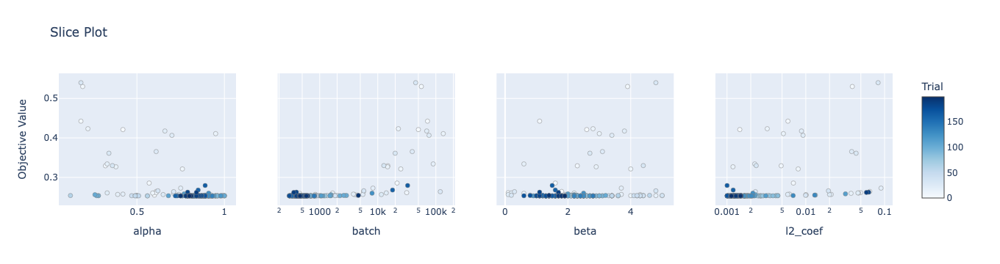

In [8]:
from optuna.visualization import plot_slice

plot_slice(study)

Опишите свои наблюдения. Если наблюдать вам мешает кривой масштаб графиков из-за слишком высоких значений лосса для некоторых trials, можно "зазумиться" в нужный интервал, выделяя на графике нужное подмножество точек или использовать аргумент `target`.

Лучшие значения следующие:

'alpha': 0.78, 'beta': 1.90, 'batch': 368, 'l2_coef': 0.0010149706924407575

**Ответьте на вопросы:**

1) Почему не нужно включать слагаемое, отвечающее за регуляризацию, в подсчет лосса для подбора гиперпараметров?

l2 коэффициент позволяет выбрать наиболее важные параметры и побороться с переобучением. По сути, он используется только при обучении, а при оценки ошибки можно пользоваться и обычным лоссом

2) Почему, если нашей целью является подбор адекватного коэффициента l2-регуляризации, мы включали в перебор остальные гиперпараметры?

Оптимальное значение лосса может быть достигнуто при других значениях гиперпараметрах (если зафиксировать альфу, бету и батчи, то найдется оптимальное только для них, здесь же мы ищем "максимум среди максимумов"

Давайте теперь посмотрим на то, что у нас получилось. Предлагается не сразу брать лучший по скору оптимизации trial, а сделать вывод, используя дополнительные данные.

  Используя график `plot_slice` выше и `study.trials`, выберите 3 лучших на ваш взгляд trial-кандидата для дальнейшего изучения.<br> Объясните ваш выбор. Если нужно, визуализируйте адекватным и наглядным образом вашу логику, чтобы проверяющий мог без труда в ней убедиться. 

In [9]:
loss_trial = []

for i in range(len(study.trials)):
    loss_trial.append(study.trials[i].value)
    
np_loss_trail = np.array(loss_trial)
ind = np_loss_trail.argsort()

Обучите по модели на каждый trial, собирая историю на обучении и валидации. Положите обученные модели и полученные истории в словари по ключу trial.number.

In [10]:
models = {}
history = {}
prep = None
features = None

if prep is None:
    prep = make_pipeline(
        StandardScaler(),
        SimpleImputer(strategy='median')
    )

if features is None:
    features = data.select_dtypes(np.number).drop(columns=['target', 'sk_id_curr']).columns

X_train = np.array(data_dict['tr'][features])
X_val = np.array(data_dict['val'][features])
y_train = np.array(data_dict['tr']['target'])
y_val = np.array(data_dict['val']['target'])

prep.fit(X_train)
X_train = prep.transform(X_train)
X_val = prep.transform(X_val)
    
for i in ind[:3]:
    loss_function = BinaryLogisticLoss(l2_coef=study.trials[ind[i]].params['l2_coef'])

    model = LinearModel(
        loss_function=loss_function,
        batch_size=study.trials[ind[i]].params['batch'],
        step_alpha=study.trials[ind[i]].params['alpha'],
        step_beta=study.trials[ind[i]].params['beta'],
        tolerance= 1e-4,
        max_iter=30,
        random_seed=911,
    )

    history[i] = model.fit(X_train, y_train, X_val=X_val, y_val=y_val, trace=True)
    models[i] = model.w

Напишите функцию `plot_trial_info`, которая выводит "информацию" о поданном trial. В эту "информацию" обязательно должно входить:
- График `feature - weight`, показывающий `top_k` признаков по модулю веса и их значения весов. Признаки должны идти по убыванию модуля веса.<br>Используйте `ax.barh`. <br> Используйте `ax.bar_label`, чтобы подписать веса к барам.<br> Используйте `ax.set_title(f'l2_coef: {l2_coef:.2e}', fontsize=15)` для этого графика.


- График "время обучения - лосс" - на обучении и валидации. Укажите "количество эпох | batch_size" в качестве title к этому графику. <br> Используйте `ax.plot`.


- Что угодно еще, что поможет вам принять решение о том, почему вы выберете один trial из этих трех.
<br><br>

Настройте размер графиков, шрифт, легенду. Убедитесь, что в вашей "информации" присутствует `trial.number, batch_size`. <br>
Визуализируйте выбранные вами trials. Убедитесь в адекватности графиков.

In [11]:
top_trials = np.array([study.trials[ind[0]], study.trials[ind[1]], study.trials[ind[2]]])

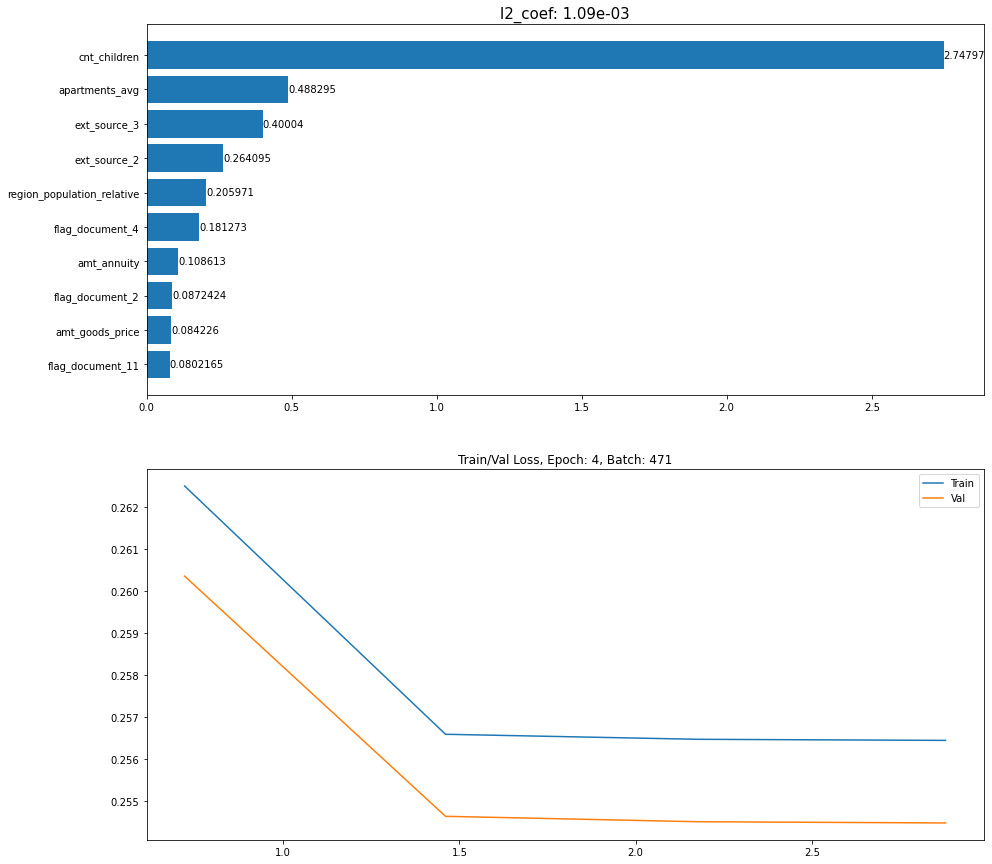

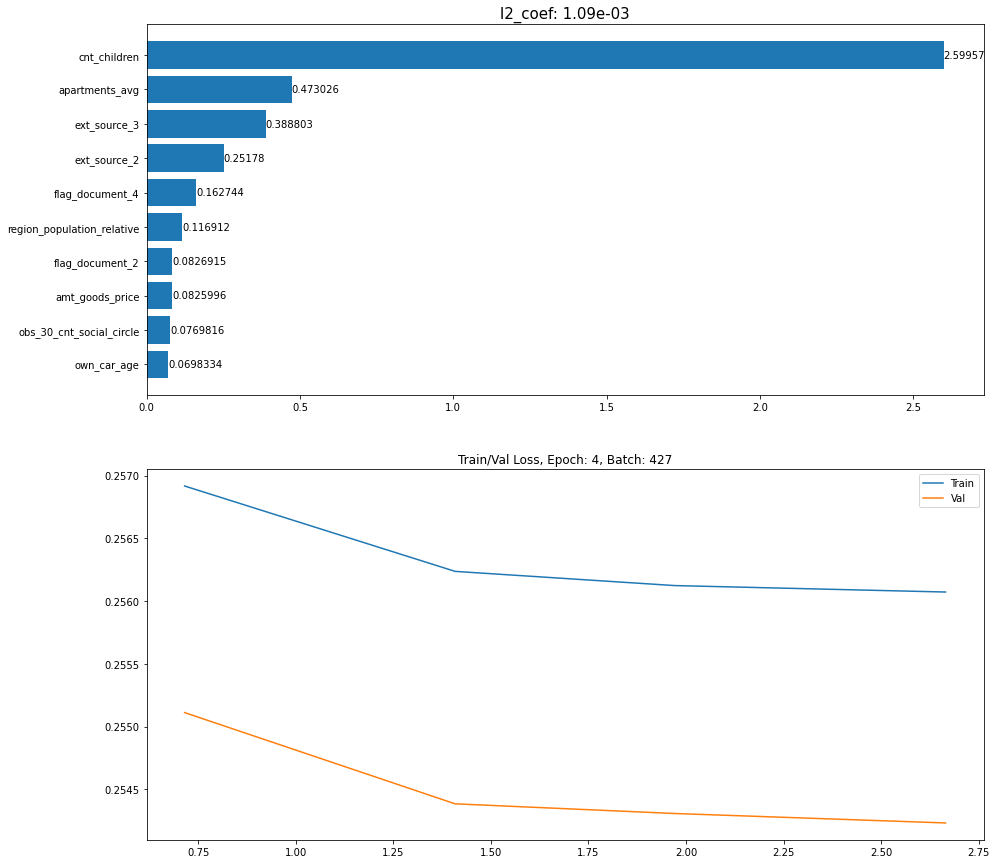

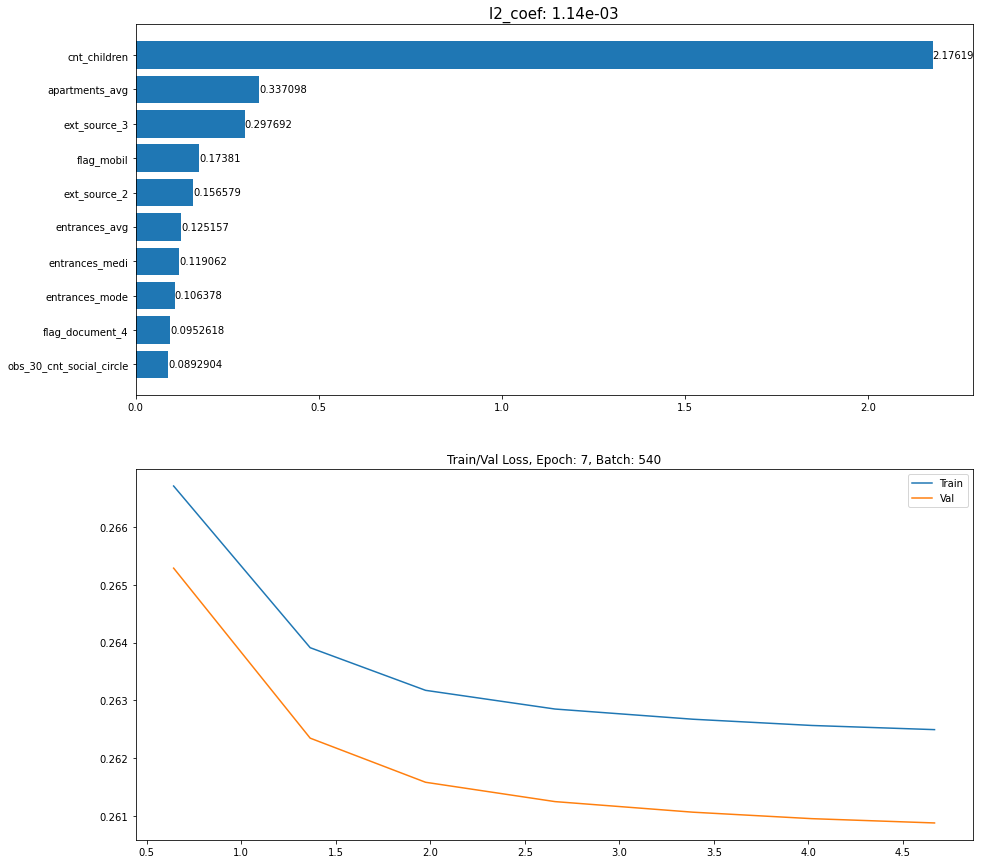

In [12]:
import matplotlib.pyplot as plt

def plot_trial_info(trial, models, history, top_k, *your_args, **your_kwargs):
    k = trial.number
    weight = abs(models[k])
    ind_w = weight.argsort()
    ind_w = ind_w[::-1]
    weight = weight[ind_w]
    data = dict(zip(features[ind_w[:top_k]], weight[:top_k]))
    fig, (ax, ax2) = plt.subplots(2, figsize=(15, 15))
    g1 = ax.barh(features[ind_w[:top_k]][::-1], weight[:top_k][::-1])
    ax.bar_label(g1)
    ax.set_title(f'l2_coef: {trial.params["l2_coef"]:.2e}', fontsize=15)
    ax2.plot(history[k]['time'], history[k]['func'])
    ax2.plot(history[k]['time'], history[k]['func_val'])
    ax2.set_title(f'Train/Val Loss, Epoch: {len(history[k]["time"])}, Batch: {trial.params["batch"]}')
    ax2.legend(['Train', 'Val'])
    

top_k = 10
for trial in top_trials:
    plot_trial_info(trial, models=models, history=history, top_k=top_k)

Опишите свои наблюдения. Если нужно, подключите визуализацию.

Ох, честно говоря, я уже даже не знаю куда смотреть 🥲

Какой в итоге коэффициент l2-регуляризации будем фиксировать для дальнейших экспериментов? <br>
Ответ объясните :)

In [17]:
print(top_trials[0].params['l2_coef'])
choice_l2_coef = top_trials[0].params['l2_coef']

0.0010887621196544776


Беру этот коэффициент. Просто лучший по лоссу

### Часть вторая. Research (6 баллов)

Давайте зафиксируем выбранный коэффициент регуляризации и проведем несколько экспериментов с `step_alpha, step_beta, batch_size`. Но для начала посмотрим - возможно, нам удастся уменьшить размер признакового пространства без сильной потери качества, чтобы ускорить наши эксперименты.

Достаньте из словаря модель, соответствующую выбранному вами лучшему trial, и нарисуйте график отсортированных модулей ее весов.

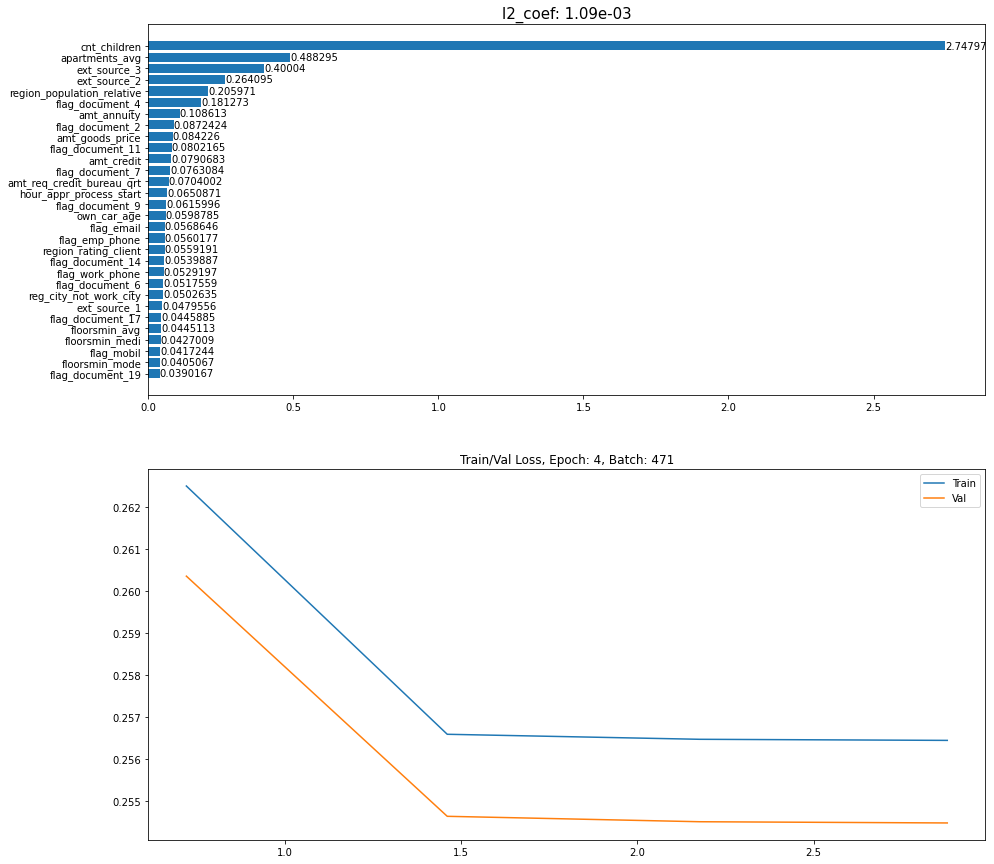

In [13]:
plot_trial_info(top_trials[0], models=models, history=history, top_k=30)

Подумайте, можно ли убрать какую-то долю признаков? Если да, то какие признаки вы уберете для дальнейших экспериментов? <br>
Ответ объясните. Могут ли возникнуть какие-то проблемы в дальнейшем?

По-хорошему, можно убрать некоторые признаки, которые идут с маленьким коэффициентом. Может возрасти ошибка

Напишите новую функцию `research_objective` для перебора `step_alpha, step_beta` при фиксированных `l2_coef, batch_size`. Остальные гиперпараметры оставьте без изменений с прошлого раза. Для перебора step_alpha используйте log-шкалу от 1e-3 до 20, для перебора step_beta - log-шкалу от 0.1 до 5.

Для `batch_size = 300, 1000, 10000, None` запустите по сессии оптимизации на выбранном вами (под)множестве признаков, собирая каждый `study` в словарик по ключу batch_size. Используйте `n_trials = 200`, TPESampler с параметром `n_startup_trials = 100`.<br>

In [12]:
def research_objective(trial, X_tr, y_tr, X_val, y_val, choice_l2_coef, batch_size):
    a = trial.suggest_float('alpha', 1e-3, 20, log = True)
    b = trial.suggest_float('beta', 0.1, 5, log = True)
    
    loss_f = BinaryLogisticLoss(choice_l2_coef)
    loss_f_2 = BinaryLogisticLoss(0)
    
    model = LinearModel(
        loss_function = loss_f,
        batch_size=batch_size,
        step_alpha=a,
        step_beta=b, 
        tolerance=1e-4,
        max_iter=30,
        random_seed=911,
    )
    model.fit(X_tr, y_tr)
    
    score = loss_f_2.func(X_val, y_val, model.w)
    
    return score

In [13]:
def start_optimization(
    objective_func, # принимает trial, X_tr, y_tr, X_val, y_val, **other_objective_kwargs
    n_trials,
    n_jobs,
    data_dict,
    study_direction=None,
    study_directions=None,
    sampler=None,
    prep=None,
    features=None,
    batch_size = None,
    l2_coef = 0,
    **other_objective_kwargs
):
    if prep is None:
        prep = make_pipeline(
            StandardScaler(),
            SimpleImputer(strategy='median')
        )
    
    if features is None:
        features = ['cnt_children', 'apartments_avg', 'ext_source_3',
       'region_population_relative', 'ext_source_2', 'amt_annuity',
       'flag_document_4', 'amt_goods_price', 'flag_document_2',
       'region_rating_client']
        
    study = optuna.create_study(
        direction='maximize', # понятно - наш objective будем хотеть максимизировать
        sampler=sampler, pruner=None
    )

    X_train = np.array(data_dict['tr'][features])
    X_val = np.array(data_dict['val'][features])
    y_train = np.array(data_dict['tr']['target'])
    y_val = np.array(data_dict['val']['target'])

    prep.fit(X_train)
    X_train = prep.transform(X_train)
    X_val = prep.transform(X_val)

    study = optuna.create_study(
        direction='minimize', 
        sampler=sampler, pruner=None
    )
    
    objective_with_args = partial(objective_func, X_tr=X_train, X_val=X_val, y_tr=y_train, y_val=y_val, batch_size = batch_size, choice_l2_coef = l2_coef)

    study.optimize(func=objective_with_args, n_trials=n_trials, timeout=None, n_jobs=n_jobs)
    
    return study

In [16]:
tpe_sampler = optuna.samplers.TPESampler(n_startup_trials=100)
batch_size = [300, 1000, 10000, None]
study_dict = {}
for size in batch_size:
    study = start_optimization(research_objective,
        n_trials=200,
        n_jobs=6,
        data_dict=data_dict,
        study_direction=None,
        study_directions=None,
        sampler=tpe_sampler,
        prep=None,
        features=None,
        # choice_l2_coef - здесь передается конкретное значение, найденное при прошлом запуске ноутбука в 1 задании, так как юпитер падает
        l2_coef = 0.0010887621196544776, 
        batch_size = size)
    study_dict[size] = study

[I 2022-11-27 21:35:19,372] A new study created in memory with name: no-name-0da03775-3a73-4148-9fac-026eb54183a4
[I 2022-11-27 21:35:19,712] A new study created in memory with name: no-name-f9c4c4ce-6fe2-4dab-8e56-9858e1f0326d
[I 2022-11-27 21:35:24,045] Trial 3 finished with value: 0.25707290278387823 and parameters: {'alpha': 0.13750280768132903, 'beta': 1.2014460435754113}. Best is trial 3 with value: 0.25707290278387823.
[I 2022-11-27 21:35:25,213] Trial 2 finished with value: 0.25853589644582115 and parameters: {'alpha': 0.4443785835744548, 'beta': 0.16050310402312684}. Best is trial 3 with value: 0.25707290278387823.
[I 2022-11-27 21:35:27,311] Trial 0 finished with value: 0.2572324562207392 and parameters: {'alpha': 2.2489366264478754, 'beta': 1.954849656010541}. Best is trial 3 with value: 0.25707290278387823.
[I 2022-11-27 21:35:28,845] Trial 4 finished with value: 0.26366837907502033 and parameters: {'alpha': 17.24731210628595, 'beta': 1.553711284664819}. Best is trial 3 wit

In [18]:
study_dict

{300: <optuna.study.study.Study at 0x7f99c4e28490>,
 1000: <optuna.study.study.Study at 0x7f99c6bb73d0>,
 10000: <optuna.study.study.Study at 0x7f99c589ad90>,
 None: <optuna.study.study.Study at 0x7f99c4d95520>}

Используя `optuna.visualization.plot_contour`, нарисуйте график зависимости `step_alpha - step_beta - objective`. Используйте аргумент `target`, чтобы обрезать значения лоссов, которые портят тепловую карту. <br>
Для каждого `batch_size` выведите такой график в отдельной ячейке.

In [ ]:
def clipper_example(frozen_trial):
    max_value = ...
    return min(frozen_trial.value, max_value)

# your code here

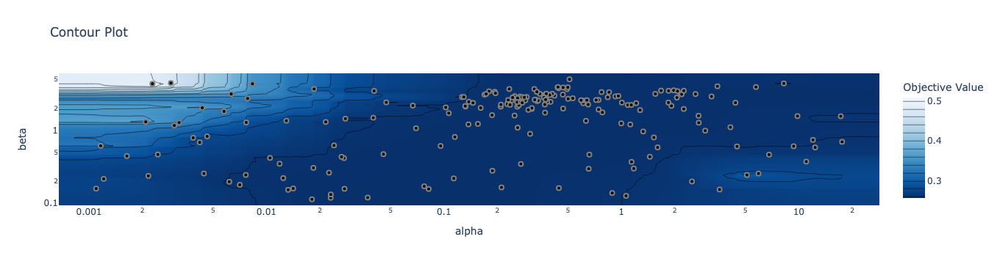

In [21]:
fig = optuna.visualization.plot_contour(study_dict[300], params=["alpha", "beta"])
fig.show()

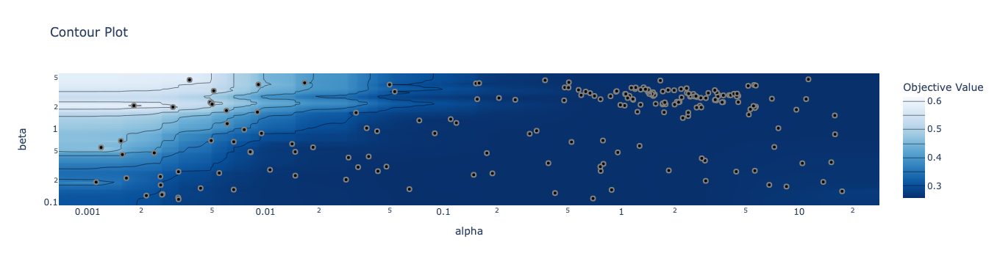

In [22]:
fig = optuna.visualization.plot_contour(study_dict[1000], params=["alpha", "beta"])
fig.show()

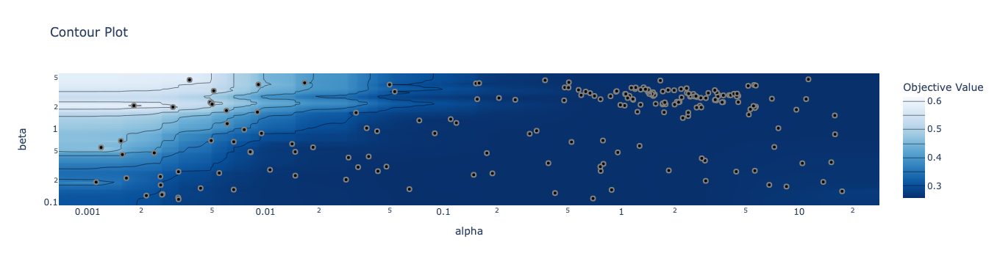

In [23]:
fig = optuna.visualization.plot_contour(study_dict[1000], params=["alpha", "beta"])
fig.show()

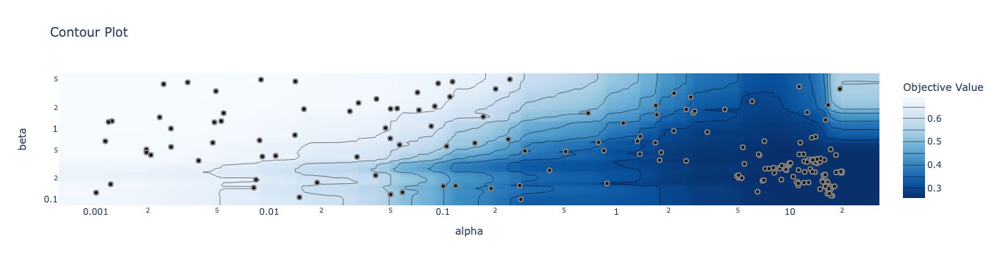

In [24]:
fig = optuna.visualization.plot_contour(study_dict[None], params=["alpha", "beta"])
fig.show()

Опишите подробно все свои наблюдения.

При увеличении размера батча, альфа увеличивается, а бета уменьшается

Мы поставили довольно большое значение `n_startup_trials` в TPESampler. Как думаете, для чего?

Для того, чтобы с меньшей вероятностью пропускать оптимальные значения

Обучите по модели для каждого `batch_size` с лучшими `step_alpha, step_beta`. Соберите историю, сложите все в словари по ключу batch_size.

In [36]:
best_params = {}

for size in batch_size:
    loss_trial = []
    study_res = study_dict[size]
    
    for i in range(len(study_res.trials)):
        loss_trial.append(study_res.trials[i].value)
    
    np_loss_trail = np.array(loss_trial)
    ind = np_loss_trail.argsort()
    best_params[size] = study_res.trials[ind[0]].params

In [65]:
best_params

{300: {'alpha': 3.2240183087487826, 'beta': 2.9021060255810784},
 1000: {'alpha': 1.7053071966686317, 'beta': 2.168623360038},
 10000: {'alpha': 6.631760273391951, 'beta': 1.6618007855282977},
 None: {'alpha': 17.066612015294133, 'beta': 0.1537828126389272}}

In [69]:
models = {}
history = {}
prep = None
features = None

if prep is None:
    prep = make_pipeline(
        StandardScaler(),
        SimpleImputer(strategy='median')
    )

if features is None:
    features = ['cnt_children', 'apartments_avg', 'ext_source_3', 'region_population_relative', 'ext_source_2', 'amt_annuity', 'flag_document_4', 'amt_goods_price', 'flag_document_2','region_rating_client']

X_train = np.array(data_dict['tr'][features])
X_val = np.array(data_dict['val'][features])
y_train = np.array(data_dict['tr']['target'])
y_val = np.array(data_dict['val']['target'])

prep.fit(X_train)
X_train = prep.transform(X_train)
X_val = prep.transform(X_val)
    
for size in best_params.keys():
    # choice_l2_coef - здесь передается конкретное значение, найденное при прошлом запуске ноутбука в 1 задании, так как юпитер падает 
    loss_function = BinaryLogisticLoss(l2_coef = 0.0010887621196544776,)

    model = LinearModel(
        loss_function=loss_function,
        batch_size=size,
        step_alpha=best_params[size]["alpha"],
        step_beta=best_params[size]["beta"],
        tolerance= 1e-4,
        max_iter=30,
        random_seed=911,
    )

    history[size] = model.fit(X_train, y_train, X_val=X_val, y_val=y_val, trace=True)
    models[size] = model

Визуализируйте результаты эксперимента. Нарисуйте графики `time-loss`, `epoch-loss`, `epoch-learning_rate` для каждого `batch_size`. <br>
На графике `epoch-loss` должно быть каким-либо образом отображено среднее время эпохи для каждого размера батча. <br>
Под `learning_rate` имеется в виду:
$$\eta_k  = \frac{\alpha}{k^{\beta}}, \quad \text{где $k$ - номер итерации (эпохи)}$$

Убедитесь, что различия между графиками, относящимися к разным `batch_size`, хорошо видны.

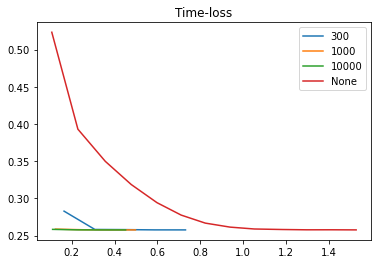

In [70]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
ax.plot(history[300]['time'], history[300]['func_val'])
ax.plot(history[1000]['time'], history[1000]['func_val'])
ax.plot(history[10000]['time'], history[10000]['func_val'])
ax.plot(history[None]['time'], history[None]['func_val'])
ax.set_title("Time-loss")
ax.legend(['300', '1000', '10000', 'None']);

Какие выводы можно сделать из увиденного?

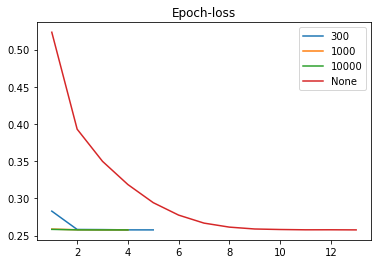

In [71]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
ax.plot(list(range(1, len(history[300]['func_val'])+1)), history[300]['func_val'])
ax.plot(list(range(1, len(history[1000]['func_val'])+1)), history[1000]['func_val'])
ax.plot(list(range(1, len(history[10000]['func_val'])+1)), history[10000]['func_val'])
ax.plot(list(range(1, len(history[None]['func_val'])+1)), history[None]['func_val'])
ax.set_title("Epoch-loss")
ax.legend(['300', '1000', '10000', 'None']);

При batch_size = 300 обучение проходит быстрее

### Часть третья. Метрика (4 балла)

Настало время проверить, во что вылились наши усилия. Посмотрим на метрику `sklearn.metrics.balanced_accuracy_score`.

Выберите по графикам выше оптимальные параметры для вашей финальной модели. Посчитайте для этой модели значение `balanced_accuracy` на обучающей, валидационной и тестовой выборках. Используйте `model.get_optimal_threshold` для подсчета порога бинаризации.

In [72]:
models

{300: <modules.linear_model.LinearModel at 0x7f99c579f5e0>,
 1000: <modules.linear_model.LinearModel at 0x7f99c6885400>,
 10000: <modules.linear_model.LinearModel at 0x7f99c579f5b0>,
 None: <modules.linear_model.LinearModel at 0x7f99c579f520>}

In [74]:
from sklearn.metrics import balanced_accuracy_score

threshold=models[300].get_optimal_threshold(X_val, y_val)
print(threshold)

-2.4034994268764835


In [83]:
prep = None
features = None

if prep is None:
    prep = make_pipeline(
        StandardScaler(),
        SimpleImputer(strategy='median')
    )

if features is None:
    features = data.select_dtypes(np.number).drop(columns=['target', 'sk_id_curr']).columns

X_train = np.array(data_dict['tr'][features])
X_test = np.array(data_dict['tst'][features])
y_train = np.array(data_dict['tr']['target'])
y_test = np.array(data_dict['tst']['target'])
X_val = np.array(data_dict['val'][features])
y_val = np.array(data_dict['val']['target'])

prep.fit(X_train)
X_train = prep.transform(X_train)
X_test = prep.transform(X_test)
X_val = prep.transform(X_val)

loss_f = BinaryLogisticLoss(0.0010887621196544776)
    
model = LinearModel(
    loss_function = loss_f,
    batch_size=300,
    step_alpha=best_params[300]["alpha"],
    step_beta=best_params[300]["beta"], 
    tolerance=1e-4,
    max_iter=30,
    random_seed=911,
)
model.fit(X_train, y_train)
y_pred = model.predict(X_train, threshold=threshold)
print(f"Train: balanced_accuracy_score={balanced_accuracy_score(y_train, y_pred):.3f}")
y_pred = model.predict(X_test, threshold=threshold)
print(f"Test: balanced_accuracy_score={balanced_accuracy_score(y_test, y_pred):.3f}")
y_pred = model.predict(X_val, threshold=threshold)
print(f"Test: balanced_accuracy_score={balanced_accuracy_score(y_val, y_pred):.3f}")

Train: balanced_accuracy_score=0.670
Test: balanced_accuracy_score=0.673
Test: balanced_accuracy_score=0.674


Что скажете?

Значения близки

В качестве послесловия предлагается на обсуждение вопрос, который мог возникнуть еще в самом начале экспериментов: почему мы подбираем гиперпараметры по лоссу, если в результате мы хотим получить модель с лучшим показателем метрики `balanced_accuracy`? Первое, что хочется ответить, так это то, что каждый раз подбирать оптимальный порог и считать метрику дольше, чем просто посчитать лосс.

  Замерьте время подсчета лосса и подбора оптимального порога + подсчет метрики, [используя](https://ipython.readthedocs.io/en/stable/interactive/magics.html) `%timeit` или `%%timeit`.

In [89]:
%%timeit
BinaryLogisticLoss(0).func(X_test, y_test, model.w)

4.41 ms ± 180 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [90]:
%%timeit
threshold = model.get_optimal_threshold(X_val, y_val)
y_pred = model.predict(X_test, threshold=threshold)
balanced_accuracy_score(y_test, y_pred)

198 ms ± 19.1 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


Подумайте (и напишите), есть ли другие причины, по которым использовать `balanced_accuracy` в нашем процессе подбора гиперпараметров не стоит?

Очень долго считается и не годится для град.спуска

По логике, уменьшение лосса есть "улучшение качества работы алгоритма", как и увеличение нашей метрики. Может быть, мы имели право перебирать гиперпараметры по лоссу, даже если на самом деле хотели от модели лишь `balanced_accuracy` побольше?

Давайте проверим. Напишите функцию `multiobjective`, которая перебирает `step_alpha, step_beta`. Зафиксируйте все остальное на адекватных значениях, согласно предыдущим экспериментам. Функция должна возвращать tuple `(loss, balanced_acc_score)` - лосс и balanced_accuracy_score с подбором оптимального порога, полученные на валидации.

In [102]:
def multiobjective(trial, X_tr, y_tr, X_val, y_val, choice_l2_coef, batch_size):
    a = trial.suggest_float('alpha', 1e-3, 20, log = True)
    b = trial.suggest_float('beta', 0.1, 5, log = True)
    
    loss_function = BinaryLogisticLoss(l2_coef=l2_coef)
    
    model = LinearModel(
        loss_function=loss_function,
        batch_size=batch_size,
        step_alpha=step_alpha,
        step_beta=step_beta,
        tolerance= 1e-4,
        max_iter=max_iter,
    )
    
    
    model.fit(X_tr, y_tr)

    loss = BinaryLogisticLoss(0).func(X_val, y_val, model.w)
    threshold = model.get_optimal_threshold(X_val, y_val)
    y_pred = model.predict(X_val, threshold=threshold)
    balanced_acc_score = balanced_accuracy_score(y_val, y_pred)
    return (loss, balanced_acc_score)   

Optuna [позволяет](https://optuna.readthedocs.io/en/stable/tutorial/20_recipes/002_multi_objective.html#sphx-glr-tutorial-20-recipes-002-multi-objective-py) оптимизировать `multiobjective-функции`, которые возвращают больше одного аргумента.

Запустите сессию оптимизации с сэмплером по умолчанию. Используйте 100-300 `n_trials`, `study_directions = ['minimize', 'maximize']`.

In [105]:
n_trials = 200
study_directions = ['minimize', 'maximize']

study_multiobjective, study_direction_multiobjective = start_optimization(multiobjective,
        batch_size=300,
        l2_coef=0.0010887621196544776,
        n_trials=n_trials,
        n_jobs=6,
        data_dict=data_dict,
        study_direction=None,
        study_directions=study_directions,
        sampler=None,
        prep=None,
        features=None,)

[I 2022-11-28 01:20:22,530] A new study created in memory with name: no-name-e7b8527e-b663-4d89-9f03-d58d72903f9b
[I 2022-11-28 01:20:22,763] A new study created in memory with name: no-name-50d1d762-71b4-4ca4-9440-1372babd12ee
[W 2022-11-28 01:20:22,765] Trial 0 failed because of the following error: NameError("name 'l2_coef' is not defined")
Traceback (most recent call last):
  File "/Users/germanzelenin/opt/anaconda3/lib/python3.9/site-packages/optuna/study/_optimize.py", line 196, in _run_trial
    value_or_values = func(trial)
  File "/var/folders/zv/mdzh5_vd2dx1b8z8y90p6xtm0000gn/T/ipykernel_51953/2990910429.py", line 5, in multiobjective
    loss_function = BinaryLogisticLoss(l2_coef=l2_coef)
NameError: name 'l2_coef' is not defined
[W 2022-11-28 01:20:22,765] Trial 1 failed because of the following error: NameError("name 'l2_coef' is not defined")
Traceback (most recent call last):
  File "/Users/germanzelenin/opt/anaconda3/lib/python3.9/site-packages/optuna/study/_optimize.py"

NameError: name 'l2_coef' is not defined

И тут я запутался и сдался ...


С помощью `optuna.visualization.plot_pareto_front` визуализируйте результаты сессии. В разных ячейках используйте разные значения аргумента `include_dominated_trials`. Используйте зум для выделения наглядной зоны, если необходимо. Подпишите ваши objectives с помощью аргумента `target_names`.

In [ ]:
# your code here

In [ ]:
# your code here

Что вы можете сказать об увиденном?

Ура! А теперь...

## Бонусная часть. Постигая ASHA (7 баллов)

В бонусной части забудем датасет и линейные модели! Вам предстоит наглядно убедиться и разобраться в том, как работает `optuna.pruners.SuccessiveHalvingPruner`, он же **ASHA**. Важно понимать, как устроены `optuna.pruners` - правильное их использование заметно сократит время ожидания и может улучшить качество.

В вашем распоряжении семинар, документация и исходный код классов в `optuna`.

### 0
Начнем с простого - будем использовать предложенный простенький `objective`, чтобы убедиться, что все `trials` успешно доходят до конца.

Все указанные параметры не изменяйте в дальнейшем, если этого не просят в задании.

In [ ]:
def objective_0(trial):
    for i in range(31):
        trial.report(val=trial.number, step=i)
        if trial.should_prune():
            raise optuna.TrialPruned()
    return 0

pruner = optuna.pruners.SuccessiveHalvingPruner(min_resource=2, reduction_factor=2,
                                                bootstrap_count=0, min_early_stopping_rate=0)
study = optuna.create_study(direction='maximize', pruner=pruner)

study.optimize(objective_0, n_trials=16, n_jobs=4)

Давайте визуализируем наш `study`. Напишите функцию `plot_study_info`, отрисовывающую жизненный путь всех `trials`. Используйте данный ниже шаблон. Под визулизацией будем понимать нечто похожее на картинки с семинара:

- ось Х - `step`, ось Y - `trial.number`.

- каждый trial - горизонтальная синяя прямая от -1 до `trial.last_step`.

- если trial [дошел до конца](https://optuna.readthedocs.io/en/stable/reference/generated/optuna.trial.TrialState.html#optuna.trial.TrialState), на конце прямой поставьте зеленый кружок, если обрезался - красный крестик [`plt.scatter(..., marker=...)`].

- синяя вертикальная прямая на отметке `step = 0` - "день рождения" trial.

- черными вертикальными прямыми расставьте `rungs`. Воспользуйтесь [исходным кодом](https://optuna.readthedocs.io/en/stable/_modules/optuna/pruners/_successive_halving.html#SuccessiveHalvingPruner) `SuccessiveHalvingPruner` для выяснения всех обстоятельств.

- зелеными вертикальными линиями отметьте те `steps`, на которых делается `trial.report`. Сделайте так, чтобы эти линии были видны поверх линий, обозначающих `rungs`, если такие случаи будут иметь место.

- что еще хотите от себя! Учтите, что trials после сессии оптимизации являются [`FrozenTrials`](https://optuna.readthedocs.io/en/stable/reference/generated/optuna.trial.FrozenTrial.html#optuna.trial.FrozenTrial).

Пожалуйста, уделите должное внимание этой функции и отладьте ее. Убедитесь, что все хорошо видно, что все адекватного размера. Вы будете ее часто использовать далее.

In [ ]:
def plot_study_info(study, min_resource, max_resource, gamma, early_stopping=0, *your_args, **your_kwargs):
    # your code here
    pass

Визуализируйте первую сессию, используя вашу фукнцию. Что в данном случае такое `max_resource`?

In [ ]:
# your code here

Почему все trials дошли до конца?

### 1

Напишите новый `objective` - попробуйте порепортить случайные значения, устроив беспорядок. Создайте новый `study` и запустите сессию оптимизации с теми же параметрами. Визуализируйте процесс и убедитесь, что все правильно. Далее, эту цепочку будем называть "запустите и визуализируйте".

In [ ]:
# your code here

Что-нибудь интересное на картинке?

### 2

Теперь напишите еще один `objective` - все должны дойти до конца, но теперь не по порядку, то есть i-й по скорости trial не должен иметь `trial.number = i - 1`. Запустите и визуализируйте.

In [ ]:
# your code here

Объясните, как вы добились того, что trials заканчивают не по порядку.

### 3

Оставьте прошлый `objective` и положите `bootstrap_count=2`. Запустите и визуализируйте.

In [ ]:
# your code here

Как в итоге работает этот аргумент?

### 4

Напишите новый `objective`, чтобы `trial.report` не всегда приходился на `step = rung`. Запустите и визуализируйте.

In [ ]:
# your code here

Объясните увиденное

### 5

Используя предыдущий `objective`, запустите сессии с аргументом прунера `min_early_stopping = 0, 1, 2, 3`.

Визуализируйте их друг под другом. Если к этому моменту вы убедились, что ваша рисовалка работает правильно, используйте `optuna.logging.set_verbosity`, чтобы скрыть вывод о ходе сессии.

In [ ]:
# your code here

Объясните, за что отвечает этот аргумент и при чем здесь `early_stopping`.

### 6

Мы достигли достаточного уровня мастерства чтобы визуализировать `optuna.pruners.HyperbandPruner`! `Hyperband` создает несколько `brackets`, отправляя тот или иной trial в тот или иной `bracket` по хэшу. Подробнее - см. семинар, 
[описание](https://optuna.readthedocs.io/en/stable/reference/generated/optuna.pruners.HyperbandPruner.html) или 
[исходный код](https://optuna.readthedocs.io/en/stable/_modules/optuna/pruners/_hyperband.html#HyperbandPruner).

Используя `objective` на ваш вкус, создайте новый `study` с `HyperbandPruner`. Подберите `max_resource` так, чтобы получилось 4 брэкета. На что еще влияет `max_resource` в `HyperbandPruner`?

Запустите и визуализируйте брэкеты друг под другом. Если нужно, напишите новую фукнцию для отрисовки брэкетов по `study`, хотя по сути - прошлая функция как раз отрисовывала один брэкет; возможно, можно лишь немного изменить её.

In [ ]:
# your code here

Опишите свои наблюдения.

### 7. Босс!

Отрисуйте слепки одного брэкета (используйте `ASHA`) в режиме реального времени, используя `ask-tell` интерфейс вместо `study.optimize`. Например, вы можете рисовать состояние брэкета (в данном случае, `study = bracket`) когда появляется каждый второй trial. Используйте `time.sleep` для того чтобы сделать картинку интереснее. Подумайте, как лучше отрисовывать, чтобы хорошо было видно развитие сюжета. Если нужно, используйте другую функцию для отрисовки. 

In [ ]:
# your code here

Опишите свои наблюдения.

Еще одно ура! Как впечатления?